In [2]:
import os
import cv2
import numpy as np
from scipy.signal import wiener
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import imutils
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from datetime import datetime
import tensorflow as tf
import matplotlib.pyplot as plt

2025-05-26 04:43:29.942733: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748234610.206613      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748234610.271127      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
base_dir = "/kaggle/working/unet_checkpoints"
log_dir = os.path.join(base_dir, "logs")
os.makedirs(base_dir, exist_ok=True)
os.makedirs(log_dir, exist_ok=True)


In [4]:
# ------------------------------------------
# Enhancement Functions
# ------------------------------------------

def apply_wiener_filter(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    filtered = wiener(gray)
    filtered = np.nan_to_num(filtered, nan=0.0, posinf=255.0, neginf=0.0)
    filtered = np.clip(filtered, 0, 255).astype(np.uint8)
    return cv2.merge([filtered] * 3)

def apply_clahe(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    merged = cv2.merge((cl, a, b))
    return cv2.cvtColor(merged, cv2.COLOR_LAB2BGR)

def normalize_image(img):
    return img.astype('float32') / 255.0

def crop_brain_region(img, mask=None, margin=0):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)
    thresh = cv2.threshold(blurred, 45, 255, cv2.THRESH_BINARY)[1]
    thresh = cv2.erode(thresh, None, iterations=2)
    thresh = cv2.dilate(thresh, None, iterations=2)

    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    if not cnts:
        return img, mask if mask is not None else img

    x, y, w, h = cv2.boundingRect(max(cnts, key=cv2.contourArea))
    x = max(x - margin, 0)
    y = max(y - margin, 0)
    w = min(w + 2 * margin, img.shape[1] - x)
    h = min(h + 2 * margin, img.shape[0] - y)

    img_cropped = img[y:y+h, x:x+w]
    if mask is not None:
        if len(mask.shape) == 2:
            mask = mask[..., np.newaxis]
        mask_cropped = mask[y:y+h, x:x+w]
        return img_cropped, mask_cropped
    return img_cropped, None

# ------------------------------------------
# Load and Preprocess Dataset
# ------------------------------------------

def load_data(base_path, target_size=(128, 128)):
    images, masks = [], []
    for label in range(4):  # 0: No Tumor, 1: Glioma, 2: Meningioma, 3: Pituitary
        image_folder = os.path.join(base_path, 'image', str(label))
        mask_folder = os.path.join(base_path, 'mask', str(label))

        for file_name in os.listdir(image_folder):
            img_path = os.path.join(image_folder, file_name)
            file_root, _ = os.path.splitext(file_name)
            mask_path = os.path.join(mask_folder, file_root + '_m.jpg')

            if not os.path.exists(mask_path):
                continue

            img = cv2.imread(img_path)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            if img is None or mask is None:
                continue
            if np.max(mask) == 0:
                continue

            img, mask = crop_brain_region(img, mask)
            if img is None or img.size == 0 or mask is None or mask.size == 0:
                continue

            img = cv2.resize(img, target_size)
            mask = cv2.resize(mask, target_size)

            img = apply_wiener_filter(img)
            img = apply_clahe(img)
            img = normalize_image(img)

            mask = (mask > 0).astype(np.float32)[..., np.newaxis]

            images.append(img)
            masks.append(mask)

    return np.array(images), np.array(masks)

# ------------------------------------------
# TensorFlow Augmentation Dataset Generator
# ------------------------------------------

def create_tf_dataset(X, Y, batch_size=16, augment=True, brightness_delta=0.05):
    def preprocess(image, mask):
        image = tf.cast(image, tf.float32)
        mask = tf.cast(mask, tf.float32)

        if augment:
            flip = tf.random.uniform([]) > 0.5
            image = tf.cond(flip, lambda: tf.image.flip_left_right(image), lambda: image)
            mask = tf.cond(flip, lambda: tf.image.flip_left_right(mask), lambda: mask)
            image = tf.image.random_brightness(image, max_delta=brightness_delta)

        image = tf.clip_by_value(image, 0.0, 1.0)
        mask = tf.clip_by_value(mask, 0.0, 1.0)

        return image, mask

    dataset = tf.data.Dataset.from_tensor_slices((X, Y))
    dataset = dataset.shuffle(buffer_size=len(X), seed=42)
    dataset = dataset.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset


In [5]:
base_dir = "/kaggle/input/brain-tumor-segmentation-dataset/Brain Tumor Segmentation Dataset"
X, Y = load_data(base_dir)
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

train_ds = create_tf_dataset(X_train, Y_train, batch_size=16, augment=True)
val_ds   = create_tf_dataset(X_val, Y_val, batch_size=16, augment=False)

/usr/local/lib/python3.11/dist-packages/scipy/signal/_signaltools.py:1673: RuntimeWarning: divide by zero encountered in divide
  res *= (1 - noise / lVar)
/usr/local/lib/python3.11/dist-packages/scipy/signal/_signaltools.py:1673: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
I0000 00:00:1748234675.625776      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


In [51]:
def load_unseen_dataset(base_dir, target_size=(128, 128), return_labels=True):
    images = []
    labels = []
    file_paths = []
    label_map = {'notumor': 0, 'glioma': 1, 'meningioma': 2, 'pituitary': 3}

    for class_name in os.listdir(base_dir):
        class_dir = os.path.join(base_dir, class_name)
        if not os.path.isdir(class_dir):
            continue

        for file_name in sorted(os.listdir(class_dir)):
            img_path = os.path.join(class_dir, file_name)

            img = cv2.imread(img_path)
            if img is None:
                continue

            # Save path for later reference
            file_paths.append(img_path)

            # Preprocess image
            img, _ = crop_brain_region(img)
            if img is None or img.size == 0:
                continue

            img = cv2.resize(img, target_size)
            img = apply_wiener_filter(img)
            img = apply_clahe(img)
            img = normalize_image(img)

            images.append(img)
            if return_labels:
                labels.append(label_map[class_name.lower()])

    if return_labels:
        return np.array(images), np.array(labels), file_paths
    return np.array(images), file_paths


In [53]:
# Load test data (e.g., for classification or evaluation)
test_dir = "/kaggle/input/brain-tumor-mri-dataset/Training"
X_test, y_test, test_paths = load_unseen_dataset(test_dir)

In [8]:
def plot_sample_from_array(X, Y, indices=None, title_prefix="Sample"):
    """
    Plots images and masks from raw NumPy arrays like X_train, Y_train.
    """
    if indices is None:
        indices = list(range(min(5, len(X))))

    for i in indices:
        image = X[i]
        mask = Y[i].squeeze()

        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.title(f"{title_prefix} {i} - Image")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(mask, cmap='gray')
        plt.title(f"{title_prefix} {i} - Mask")
        plt.axis('off')
        plt.tight_layout()
        plt.show()

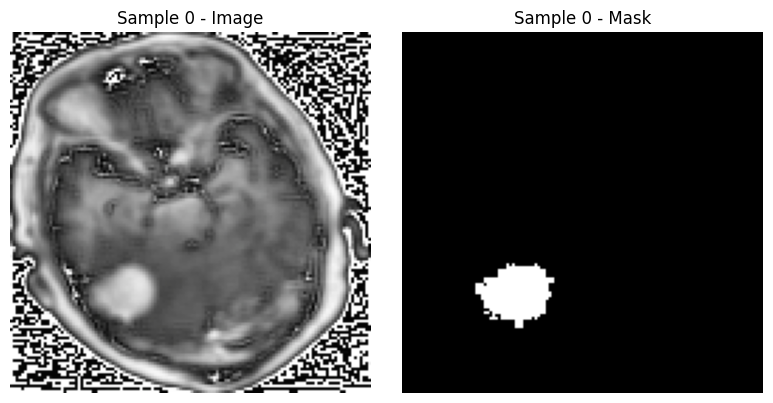

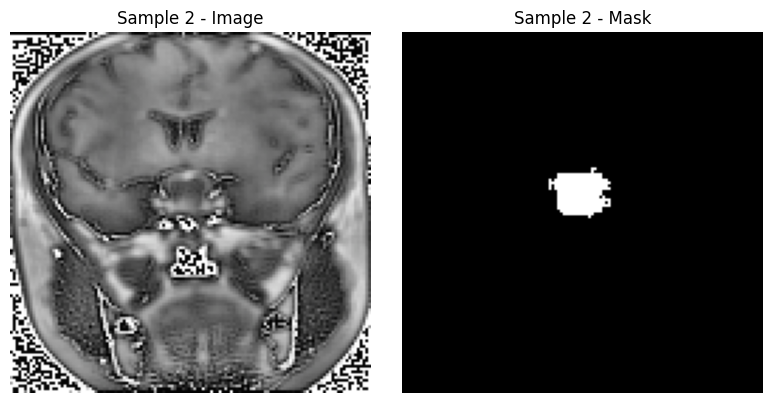

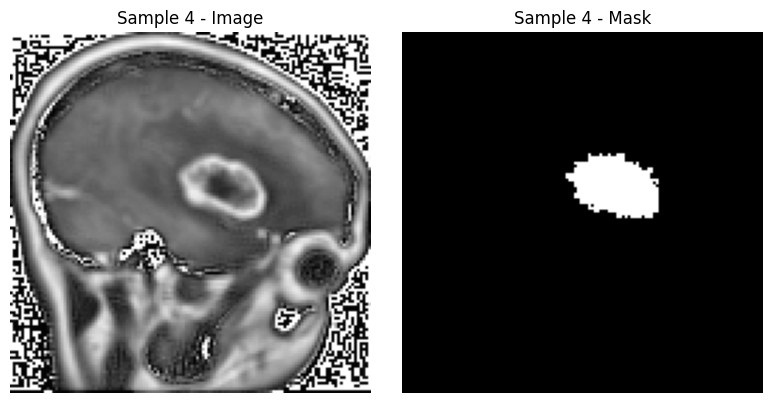

In [9]:
plot_sample_from_array(X_train, Y_train, indices=[0, 2, 4])

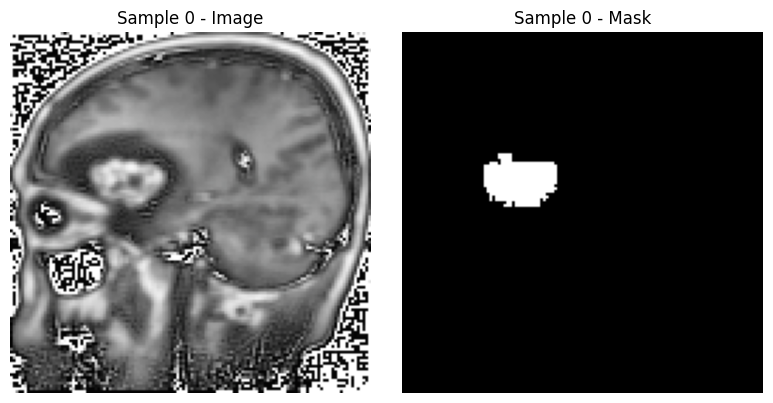

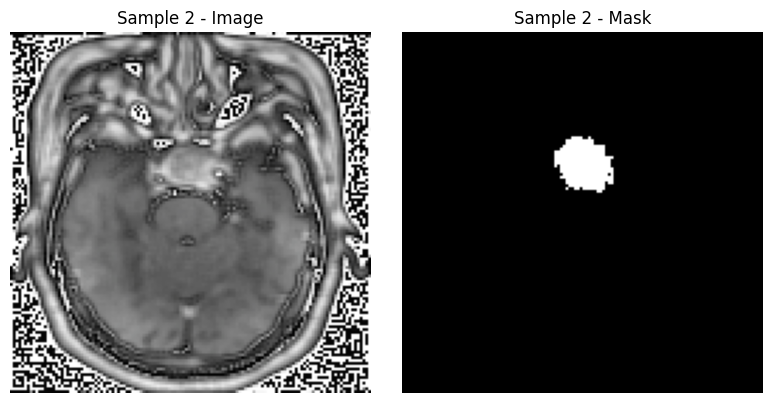

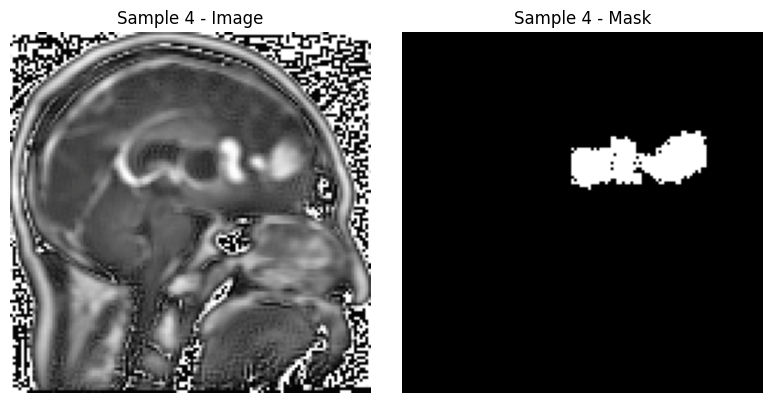

In [10]:
plot_sample_from_array(X_val, Y_val, indices=[0, 2, 4])

In [11]:
def plot_augmented_batch(dataset, batch_size=4, overlay=False, title="Augmented Batch"):
    """
    Plots image-mask pairs from tf.data.Dataset batches.
    """
    for X_batch, Y_batch in dataset.take(1):
        X_batch = X_batch.numpy()
        Y_batch = Y_batch.numpy()

        for i in range(min(batch_size, X_batch.shape[0])):
            image = X_batch[i]
            mask = Y_batch[i].squeeze()

            plt.figure(figsize=(8, 4))

            # Image or overlay
            plt.subplot(1, 2, 1)
            if overlay:
                plt.imshow(image)
                plt.imshow(mask, cmap='Reds', alpha=0.4)
                plt.title(f"{title} {i} - Overlay")
            else:
                plt.imshow(image)
                plt.title(f"{title} {i} - Image")
            plt.axis('off')

            # Mask
            plt.subplot(1, 2, 2)
            plt.imshow(mask, cmap='gray')
            plt.title(f"{title} {i} - Mask")
            plt.axis('off')

            plt.tight_layout()
            plt.show()


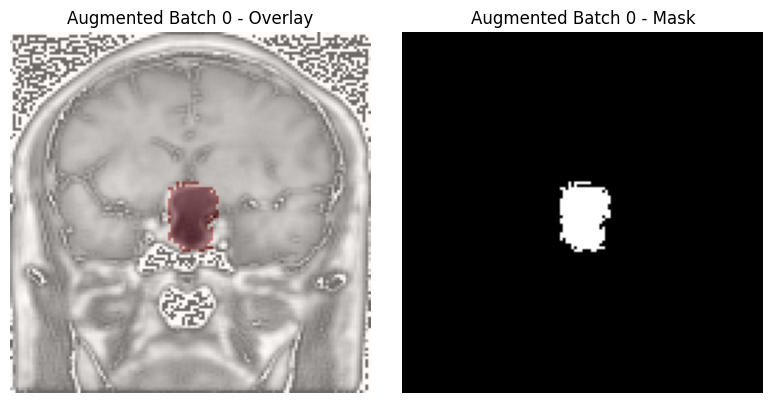

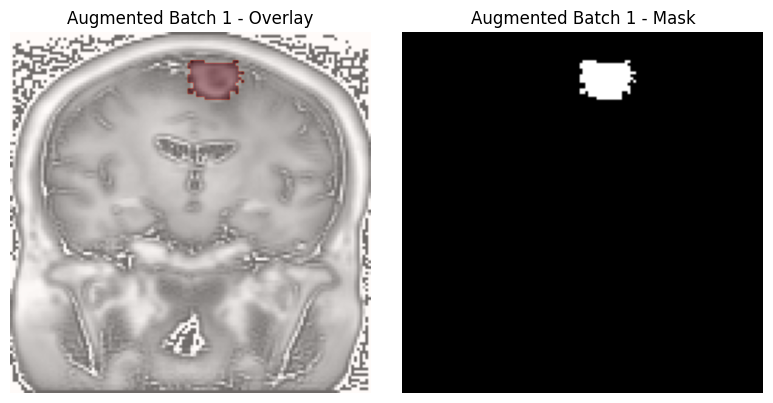

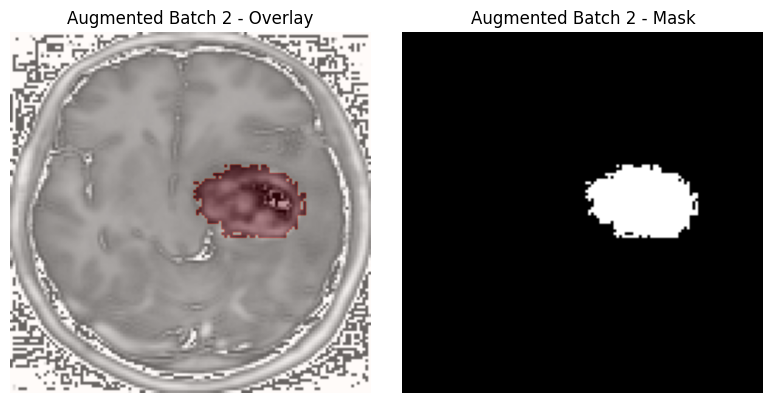

In [12]:
plot_augmented_batch(train_ds, batch_size=3, overlay=True)

In [13]:
def plot_unseen_comparison(base_dir, indices=None, target_size=(256, 256), max_samples=5):
    """
    Compare original and preprocessed images from unseen classification dataset.
    
    Parameters:
        base_dir (str): Path to unseen dataset (e.g., "/kaggle/input/brain-tumor-mri-dataset/Training")
        indices (list): Optional list of global sample indices to plot
        target_size (tuple): Final size after preprocessing
        max_samples (int): Number of random samples to show if indices is None
    """
    import matplotlib.pyplot as plt

    # Prepare list of (image_path, class_name)
    image_list = []
    for class_name in sorted(os.listdir(base_dir)):
        class_path = os.path.join(base_dir, class_name)
        if not os.path.isdir(class_path): continue

        for img_name in sorted(os.listdir(class_path)):
            image_list.append((os.path.join(class_path, img_name), class_name))

    # Choose samples
    if indices is None:
        indices = np.random.choice(len(image_list), size=min(max_samples, len(image_list)), replace=False)

    for i in indices:
        img_path, label = image_list[i]
        original = cv2.imread(img_path)

        if original is None:
            print(f"[SKIPPED] Failed to read {img_path}")
            continue

        # Apply preprocessing
        processed, _ = crop_brain_region(original.copy())
        if processed is None or processed.size == 0:
            print(f"[SKIPPED] Failed to crop {img_path}")
            continue

        processed = cv2.resize(processed, target_size)
        processed = apply_wiener_filter(processed)
        processed = apply_clahe(processed)
        processed = normalize_image(processed)

        # Plot comparison
        plt.figure(figsize=(8, 4))
        
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
        plt.title(f"{label} - Original")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(processed)
        plt.title(f"{label} - Preprocessed")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

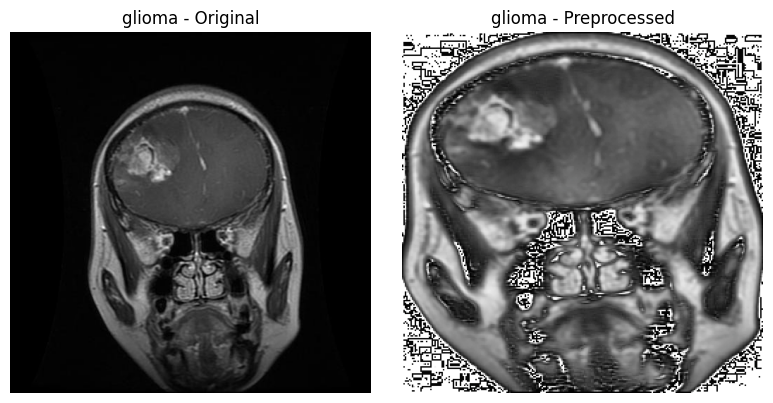

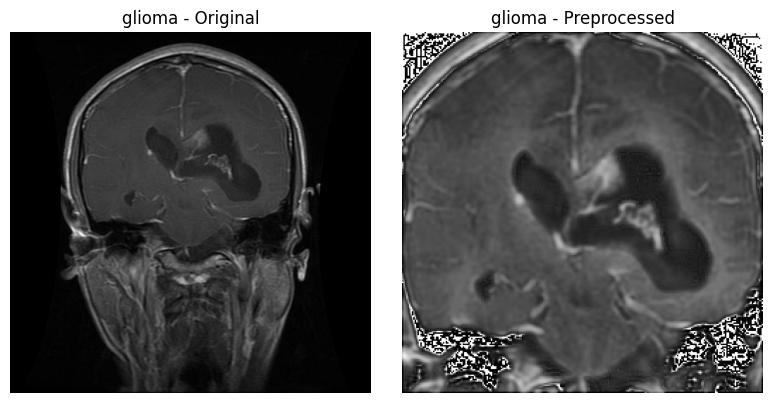

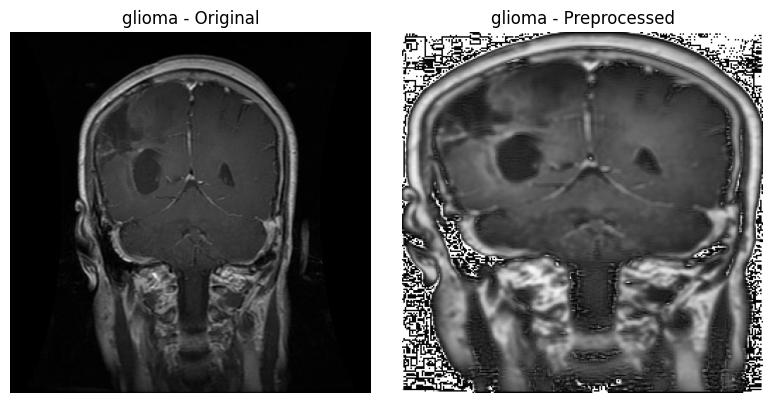

In [14]:
plot_unseen_comparison("/kaggle/input/brain-tumor-mri-dataset/Training", indices=[0, 4, 10])

In [15]:
def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    union = tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

def sensitivity(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    true_positives = tf.keras.backend.sum(y_true_f * y_pred_f)
    possible_positives = tf.keras.backend.sum(y_true_f)
    return (true_positives + smooth) / (possible_positives + smooth)
    
def dice_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def combined_loss(y_true, y_pred):
    bce = binary_crossentropy(y_true, y_pred)
    d_loss = dice_loss(y_true, y_pred)
    return bce + d_loss

def dice_coef_named(y_true, y_pred):
    return dice_coef(y_true, y_pred)
dice_coef_named.__name__ = 'dice_coef'

def iou_score_named(y_true, y_pred):
    return iou_score(y_true, y_pred)
iou_score_named.__name__ = 'iou_score'

def sensitivity_named(y_true, y_pred):
    return sensitivity(y_true, y_pred)
sensitivity_named.__name__ = 'sensitivity'

In [16]:
def conv_block(inputs, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x

def encoder_block(inputs, num_filters):
    x = conv_block(inputs, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p

def decoder_block(inputs, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, 2, strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_unet(input_shape):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024)

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    model = Model(inputs, outputs, name="UNET")
    return model


In [37]:
import os
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard
import datetime

# Setup directories
base_dir = "/kaggle/working/unet_checkpoints"
log_dir = os.path.join(base_dir, "logs")
os.makedirs(base_dir, exist_ok=True)
os.makedirs(log_dir, exist_ok=True)

# ✅ Checkpoint in writable directory
checkpoint_cb = ModelCheckpoint(
    filepath=os.path.join(base_dir, "best_model.keras"),
    monitor='val_dice_coef',
    save_best_only=True,
    save_weights_only=False,
    mode='max',
    verbose=1
)

# ✅ TensorBoard in writable directory
tensorboard_cb = TensorBoard(
    log_dir=log_dir,
    histogram_freq=1,
    write_graph=True,
    write_images=True
)


In [25]:
input_shape = (128, 128, 3)
model = build_unet(input_shape)

model.compile(
    optimizer='adam',
    loss=combined_loss,  # your custom loss: Dice + BCE
    metrics=[dice_coef, iou_score, sensitivity],
    steps_per_execution=1  # prevents OptionalFromValue crash
)

model.summary()

Model: "UNET"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_19 (Conv2D)        │ (None, 128, 128, 64)   │          1,792 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_18    │ (None, 128, 128, 64)   │            256 │ conv2d_19[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_18             │ (None, 128, 128, 64)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_20 (Conv2D)        │ (None, 128, 128, 64)   │         36,928 │ activation_18[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_19    │ (None, 128, 128, 64)   │            256 │ conv2d_20[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_19             │ (None, 128, 128, 64)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_4           │ (None, 64, 64, 64)     │              0 │ activation_19[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_21 (Conv2D)        │ (None, 64, 64, 128)    │         73,856 │ max_pooling2d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_20    │ (None, 64, 64, 128)    │            512 │ conv2d_21[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_20             │ (None, 64, 64, 128)    │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_22 (Conv2D)        │ (None, 64, 64, 128)    │        147,584 │ activation_20[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_21    │ (None, 64, 64, 128)    │            512 │ conv2d_22[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_21             │ (None, 64, 64, 128)    │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_5      

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [26]:
tumor_counts = np.sum([np.max(mask) > 0 for mask in Y_train])
print(f"{tumor_counts}/{len(Y_train)} masks have tumors")


2108/2113 masks have tumors


In [27]:
train_ds = create_tf_dataset(X_train, Y_train, batch_size=16, augment=True)
val_ds = create_tf_dataset(X_val, Y_val, batch_size=16, augment=False)


In [28]:
print("X_train shape:", X_train.shape)
print("Y_train shape:", Y_train.shape)
print("X_train dtype:", X_train.dtype)
print("Y_train dtype:", Y_train.dtype)
print("Mask unique values:", np.unique(Y_train))


X_train shape: (2113, 128, 128, 3)
Y_train shape: (2113, 128, 128, 1)
X_train dtype: float32
Y_train dtype: float32
Mask unique values: [0. 1.]


In [29]:
for x, y in train_ds.take(1):
    print("x batch shape:", x.shape)
    print("y batch shape:", y.shape)


x batch shape: (16, 128, 128, 3)
y batch shape: (16, 128, 128, 1)


In [38]:
print("Saving to:", checkpoint_cb.filepath)


Saving to: /kaggle/working/unet_checkpoints/best_model.keras


In [39]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=5,
    callbacks=[checkpoint_cb, tensorboard_cb]
)

# Save intermediate model
model.save("/kaggle/working/unet_checkpoints/checkpoint_5.keras")


Epoch 1/5
132/133 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - dice_coef: 0.7365 - iou_score: 0.5890 - loss: 0.3303 - sensitivity: 0.7135
Epoch 1: val_dice_coef improved from -inf to 0.73164, saving model to /kaggle/working/unet_checkpoints/best_model.keras
133/133 ━━━━━━━━━━━━━━━━━━━━ 25s 190ms/step - dice_coef: 0.7366 - iou_score: 0.5891 - loss: 0.3302 - sensitivity: 0.7136 - val_dice_coef: 0.7316 - val_iou_score: 0.5911 - val_loss: 0.3145 - val_sensitivity: 0.6821
Epoch 2/5
132/133 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - dice_coef: 0.7712 - iou_score: 0.6329 - loss: 0.2845 - sensitivity: 0.7409
Epoch 2: val_dice_coef did not improve from 0.73164
133/133 ━━━━━━━━━━━━━━━━━━━━ 23s 173ms/step - dice_coef: 0.7712 - iou_score: 0.6328 - loss: 0.2845 - sensitivity: 0.7409 - val_dice_coef: 0.6187 - val_iou_score: 0.4549 - val_loss: 0.5135 - val_sensitivity: 0.4676
Epoch 3/5
132/133 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - dice_coef: 0.7888 - iou_score: 0.6564 - loss: 0.2634 - sensitivity: 0.7606
Epoch 3: v

E0000 00:00:1748235702.284602      98 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1748235702.518837      98 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


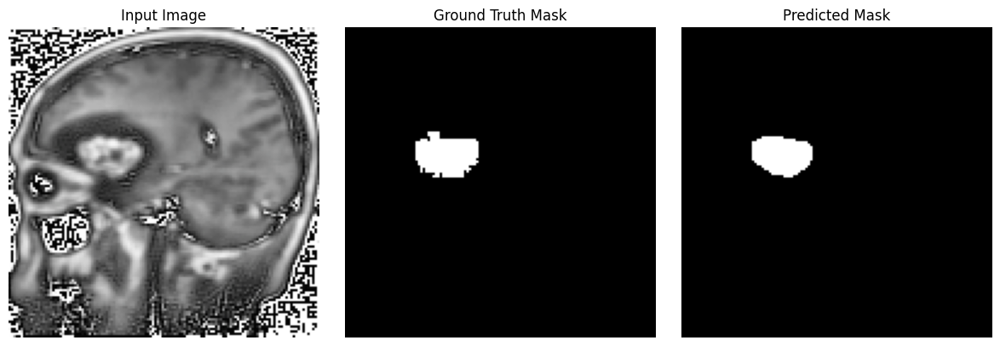

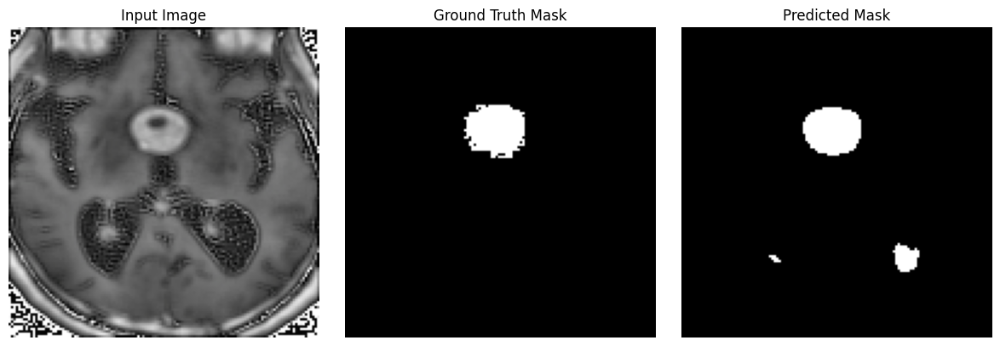

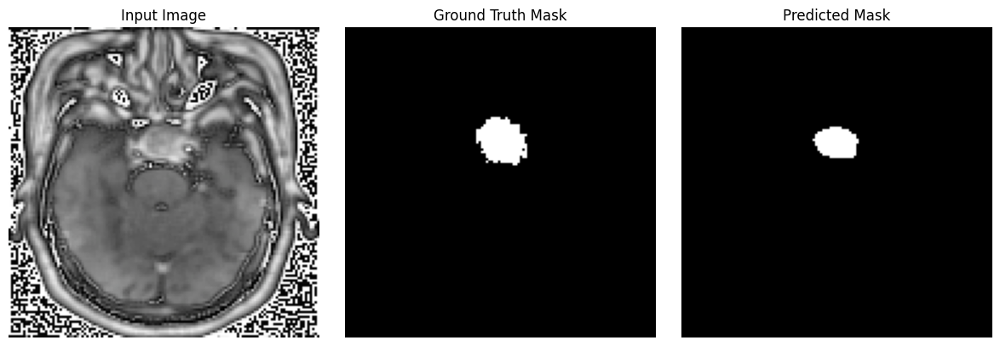

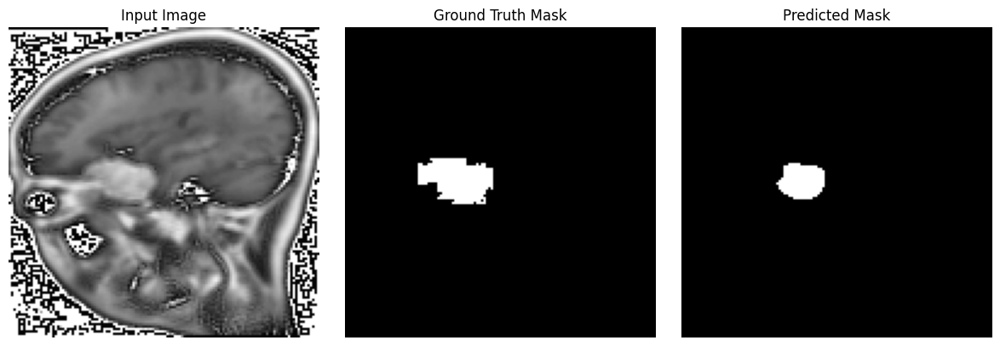

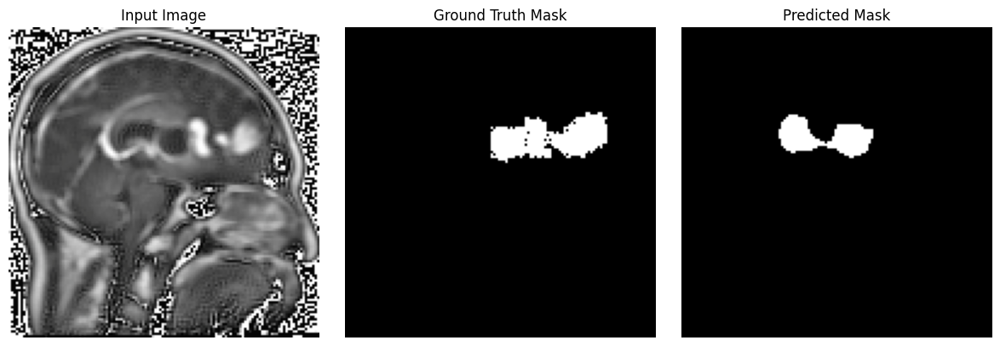

In [40]:
import matplotlib.pyplot as plt

# Predict on the first 5 validation samples
preds = model.predict(X_val[:5])

for i in range(5):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(X_val[i])
    plt.title("Input Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(Y_val[i].squeeze(), cmap='gray')
    plt.title("Ground Truth Mask")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow((preds[i].squeeze() > 0.5).astype(np.uint8), cmap='gray')
    plt.title("Predicted Mask")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [41]:
# Load TensorBoard extension
%load_ext tensorboard

# Launch TensorBoard
%tensorboard --logdir /kaggle/working/unet_checkpoints/logs


<IPython.core.display.Javascript object>

In [44]:
from tensorflow.keras.models import load_model

# Load the saved model from epoch 5 checkpoint
model = load_model(
    "/kaggle/working/unet_checkpoints/checkpoint_5.keras",  # updated path
    custom_objects={
        "dice_coef": dice_coef,
        "iou_score": iou_score,
        "sensitivity": sensitivity,
        "combined_loss": combined_loss
    }
)

# (Optional) Recompile to make sure training config is correct
model.compile(
    optimizer='adam',
    loss=combined_loss,
    metrics=[dice_coef, iou_score, sensitivity],
    steps_per_execution=1
)

# Resume training from epoch 5
history = model.fit(
    train_ds,
    validation_data=val_ds,
    initial_epoch=5,   # resume from this epoch
    epochs=40,         # total epochs to train until
    callbacks=[checkpoint_cb, tensorboard_cb]
)

model.save("/kaggle/working/unet_checkpoints/final_model.keras")

Epoch 6/40
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - dice_coef: 0.8062 - iou_score: 0.6799 - loss: 0.2441 - sensitivity: 0.7885
Epoch 6: val_dice_coef did not improve from 0.77196
133/133 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - dice_coef: 0.8062 - iou_score: 0.6799 - loss: 0.2441 - sensitivity: 0.7885 - val_dice_coef: 0.6319 - val_iou_score: 0.4666 - val_loss: 0.4505 - val_sensitivity: 0.5863
Epoch 7/40
132/133 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - dice_coef: 0.8074 - iou_score: 0.6816 - loss: 0.2427 - sensitivity: 0.7836
Epoch 7: val_dice_coef did not improve from 0.77196
133/133 ━━━━━━━━━━━━━━━━━━━━ 23s 172ms/step - dice_coef: 0.8074 - iou_score: 0.6816 - loss: 0.2426 - sensitivity: 0.7837 - val_dice_coef: 0.7361 - val_iou_score: 0.5873 - val_loss: 0.3419 - val_sensitivity: 0.6836
Epoch 8/40
132/133 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - dice_coef: 0.8119 - iou_score: 0.6873 - loss: 0.2321 - sensitivity: 0.7895
Epoch 8: val_dice_coef did not improve from 0.77196
133/133 ━━━━━━━━━━━━━━━

In [45]:
from tensorflow.keras.models import load_model

model = load_model(
    "/kaggle/working/unet_checkpoints/best_model.keras",
    custom_objects={
        "dice_coef": dice_coef,
        "iou_score": iou_score,
        "sensitivity": sensitivity,
        "combined_loss": combined_loss
    }
)


In [46]:
pred_masks = model.predict(X_test)

179/179 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step


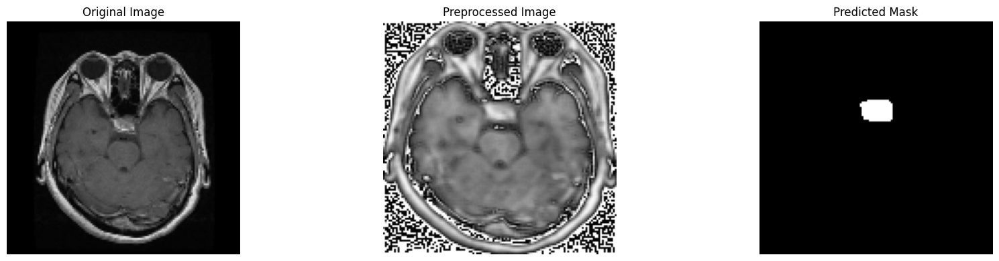

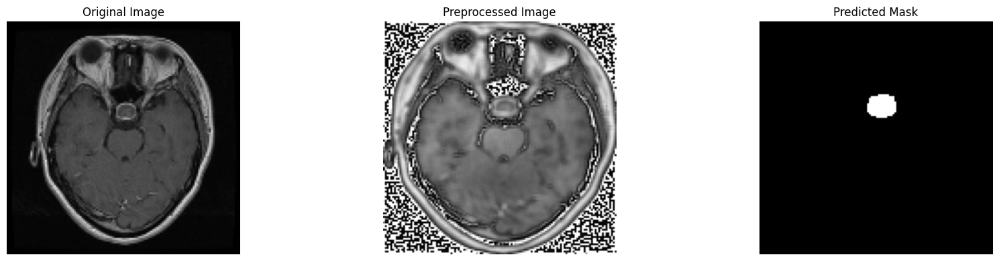

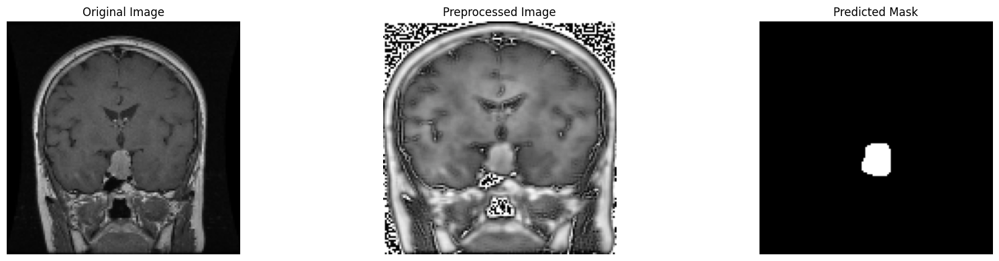

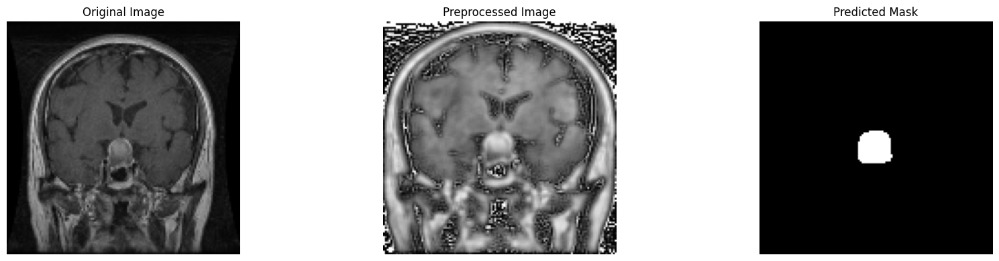

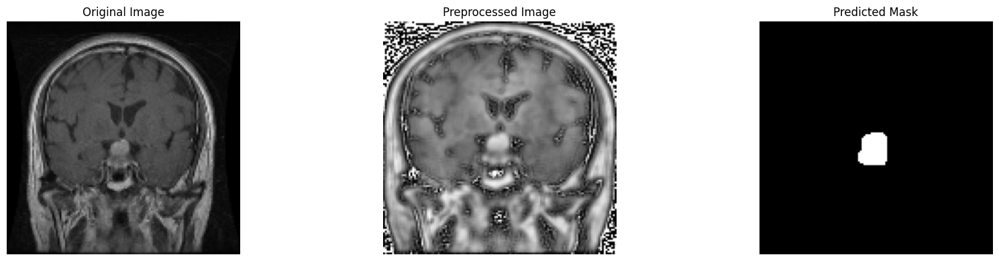

...

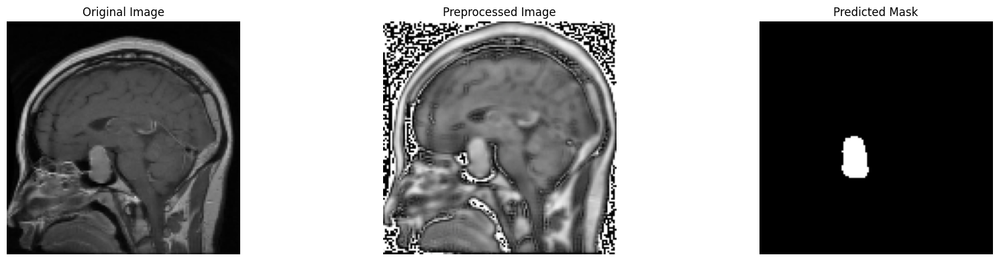

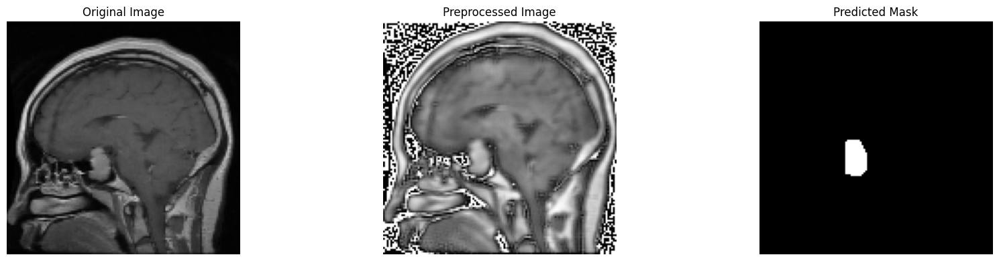

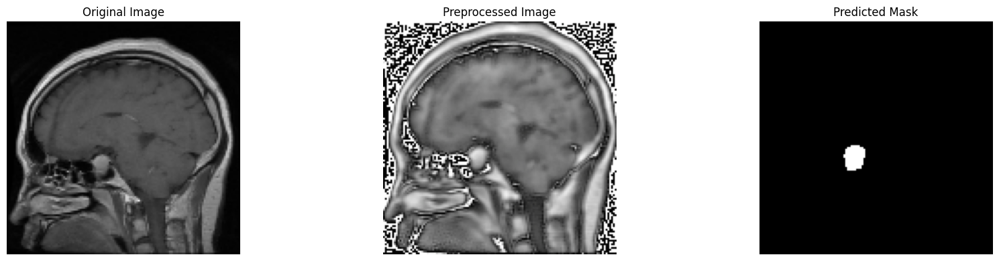

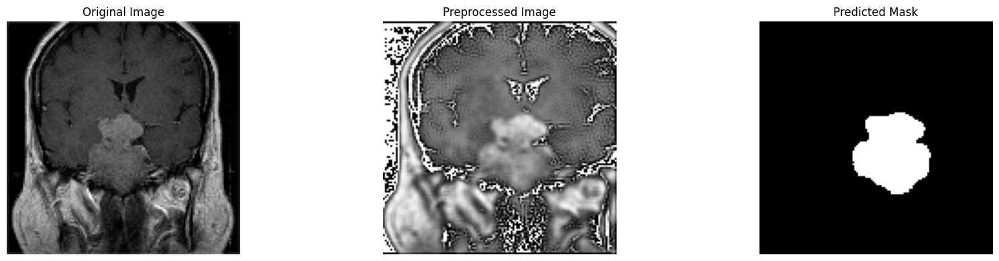

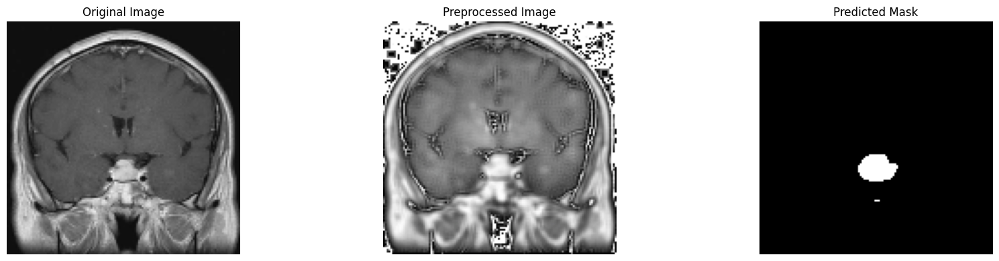

In [56]:
import cv2
import matplotlib.pyplot as plt

for i in range(30):
    # Original image from file path
    orig_img = cv2.imread(test_paths[i])
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    orig_img = cv2.resize(orig_img, (128, 128))

    # Preprocessed image from X_test (scaled to 0-1)
    preprocessed_img = (X_test[i] * 255).astype(np.uint8)

    # Predicted mask (binarized)
    mask = (pred_masks[i].squeeze() > 0.5).astype(np.uint8)

    # Plot all three
    plt.figure(figsize=(18, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(orig_img)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(preprocessed_img)
    plt.title("Preprocessed Image")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(mask, cmap='gray')
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


In [ ]:
# import tensorflow as tf

# history = model.fit(
#     train_ds,
#     validation_data=val_ds,
#     epochs=40,
#     callbacks=[checkpoint_cb, tensorboard_cb]
# )

# model.save(os.path.join(base_dir, "final_model.keras"))

In [ ]:
print("X_train shape:", X_train.shape)
print("Y_train shape:", Y_train.shape)


In [ ]:
assert len(X_train) > 0, "X_train is empty"
assert len(Y_train) > 0, "Y_train is empty"


In [ ]:
# Load TensorBoard extension
%load_ext tensorboard

# Launch TensorBoard
%tensorboard --logdir /kaggle/working/unet_checkpoints/logs
